In [83]:
%matplotlib inline
%config InlineBackend.figure_format = "retina"
from IPython.display import display
import importlib

In [45]:
## all inputs

# for viewer
root_dir = "/home/ysuzuki/work/RepeatAssembly/datruf_run/dmel/"
db_file = root_dir + "DMEL.db"
las_file = root_dir + "TAN.DMEL.las"
out_dir = root_dir + "tmp/"   # this should be a DB-specific directory, otherwise read ID probably conflicts

gepard_root = "/home/ysuzuki/work/software/gepard/"
gepard_jar = gepard_root + "dist/Gepard-1.40.jar"
gepard_mat = gepard_root + "resources/matrices/edna.mat"
gepard_command = "java -cp %s org.gepard.client.cmdline.CommandLine -matrix %s" % (gepard_jar, gepard_mat)

# for runner
dbdump = root_dir + "datander_dbdump"
ladump = root_dir + "datander_ladump"

# for plotter
with_extension_border = "/home/ysuzuki/work/RepeatAssembly/datander_dmel/compare_trf_and_datander/with_extension_border"
without_extension_border = "/home/ysuzuki/work/RepeatAssembly/datruf_run/dmel/without_extension_border"
without_extension_mean = "/home/ysuzuki/work/RepeatAssembly/datruf_run/dmel/without_extension_mean"
without_extension_median = "/home/ysuzuki/work/RepeatAssembly/datruf_run/dmel/without_extension_median"
trf = "/home/ysuzuki/work/RepeatAssembly/datander_dmel/compare_trf_and_datander/trf_result"
mtr = "/home/ysuzuki/work/RepeatAssembly/datander_dmel/compare_trf_and_datander/mtr_result"

# datruf viewer

Given a ID of one read (as used in DAZZ_DB), this viewer generates following plots:

1. dot plot (by gepard)
2. alignment plot (by datander; using start/end points of all self-vs-self alignments)
    * purple: TR alignments used for unit length estimation
    * red: TR alignments in the covering set
    * blue: other TR alignments
    * black: other alignments
    * [opt-in] green: grid lines staring from all start/end points
3. alignment path plot (by datander; only for puple alignments above)
    * black: daligner's trace of alignments
    * [opt-out] green: "reflecting snake" starting from the start position of each alignment
4. DAG constructed from each set of unit sequences

In [11]:
from datruf_viewer import Viewer

In [72]:
## reload modules (for debug)
import datruf_viewer, datruf_core, datruf_io, datruf_utils
importlib.reload(datruf_viewer)
importlib.reload(datruf_core)
importlib.reload(datruf_io)
importlib.reload(datruf_utils)
from datruf_viewer import Viewer

In [74]:
v = Viewer(root_dir, db_file, las_file, out_dir, gepard_command)

In [87]:
# See the example in the bottom of this page instead of here
#v.set_read(22)
#v.dot_plot()
#v.alignment_plot()
#v.path_plot()
#v.consensus()

# datruf runner

In [115]:
!(python datruf_run.py --help)

usage: datruf_run.py [-h] [--dbdump DBDUMP] [--ladump LADUMP]
                     [--out_file OUT_FILE] [--start_dbid START_DBID]
                     [--end_dbid END_DBID] [--n_core N_CORE] [--only_interval]
                     [--on_the_fly]
                     db_file las_file

Run datruf with many reads

positional arguments:
  db_file               DAZZ_DB file
  las_file              output of TANmask

optional arguments:
  -h, --help            show this help message and exit
  --dbdump DBDUMP       Output of `DBdump -r -h -mtan <db_file>`. This will be
                        automatically generated if it does not exist. In
                        <on_the_fly> mode, this is not used. [datander_dbdump]
  --ladump LADUMP       Output of `LAdump -c <db_file> <las_file>`. This will
                        be automatically generated if it does not exist. In
                        <on_the_fly> mode, this is not used. [datander_ladump]
  --out_file OUT_FILE   A file for outputting

In [116]:
!(python datruf_run.py {db_file} {las_file} --dbdump {dbdump} --ladump {ladump} --start_dbid 1 --end_dbid 100; head -10 datruf_result)

	dbid	start	end	unit length
0	20	5	6887	18
1	22	907	1461	12
2	22	1796	2430	40
3	24	16	18250	5248
4	46	10450	23097	6057
5	53	11	20826	15
6	56	6943	8632	350
7	56	8633	10789	252
8	58	5444	9062	250


# datruf plotter

Plot results of datruf mainly for comparison with TRF and mTR

In [36]:
from datruf_plot import Plotter

In [66]:
## reload modules (for debug)
import datruf_plot
importlib.reload(datruf_plot)
from datruf_plot import Plotter

In [88]:
#p = Plotter(end_dbid=10000)
#p.add_result("wext_border", with_extension_border)
#p.add_result("woext_border", without_extension_border)
#p.add_result("woext_mean", without_extension_mean)
#p.add_result("woext_median", without_extension_median)

In [68]:
p = Plotter(end_dbid=10000)
p.add_result("datander", without_extension_mean)
p.add_result("TRF", trf)
p.add_result("mTR", mtr)

end dbid (datander) = 10000
end dbid (TRF) = 10000
end dbid (mTR) = 10000


In [80]:
results = p.get_results()
results.head()

,dbid,method,start,end,repeat length,unit length,copy number,unit sequence
0,20,datander,5,6887,6882,18,382.333333,NaN
1,20,TRF,5,6897,6892,13,530.153846,AAGAGAGAAAGAG
2,22,datander,899,2419,1520,131,11.603053,NaN
3,24,datander,16,18250,18234,5248,3.474466,NaN
4,39,mTR,2241,2315,74,7,10.571429,AATATAA


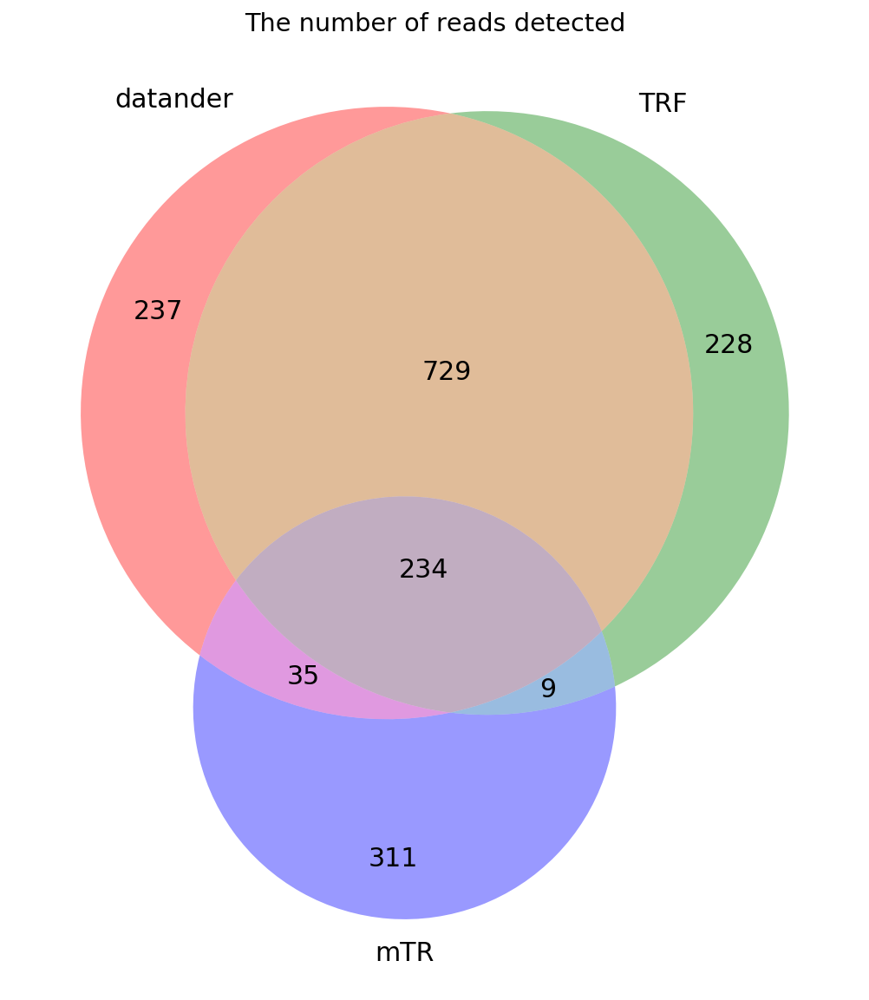

In [55]:
p.venn3_detected_read()

In [70]:
p.plot_unit_frequency()

In [69]:
p.plot_unit_length()

## Combined all-in-one function for single-read visualization

In [97]:
# Define v and results before using this!

def visualize(read_id, dot_plot=True, alignment_plot=True, path_plot=False, consensus=False):
    display(results[results["dbid"] == read_id])
    v.set_read(read_id)
    if dot_plot:
        v.dot_plot()
    if alignment_plot:
        v.alignment_plot()
    if path_plot:
        v.path_plot()
    if consensus:
        v.consensus()

,dbid,method,start,end,repeat length,unit length,copy number,unit sequence
8,56,TRF,6453,7017,564,182,3.098901,ATTGTCGCCTATCATATTAATTAATATAAAGAATTTTATAAAGAGT...
9,56,datander,6943,8632,1689,350,4.825714,NaN
10,56,TRF,8171,11043,2872,247,11.627530,TACTATAGGTAGGCAGTGGTTGCCGGACCTCTCATATTGTTCAAAA...
11,56,datander,8633,10789,2156,252,8.555556,NaN


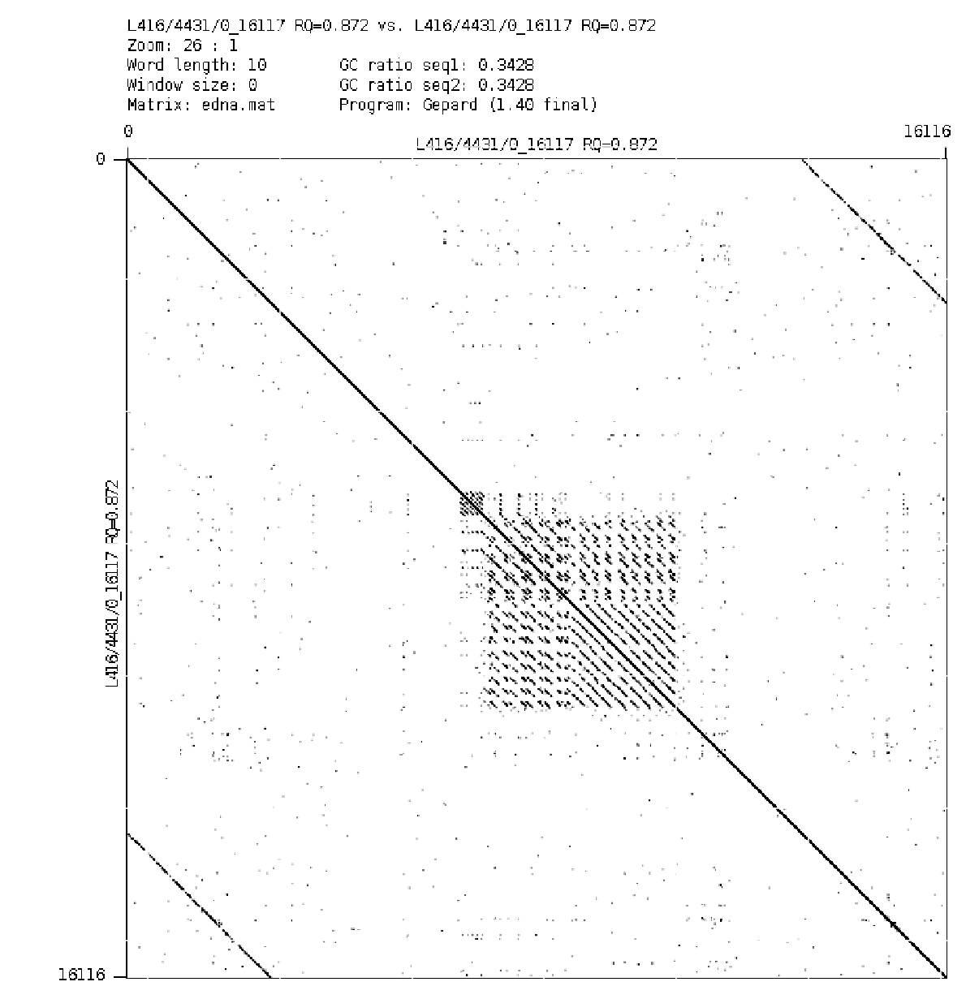

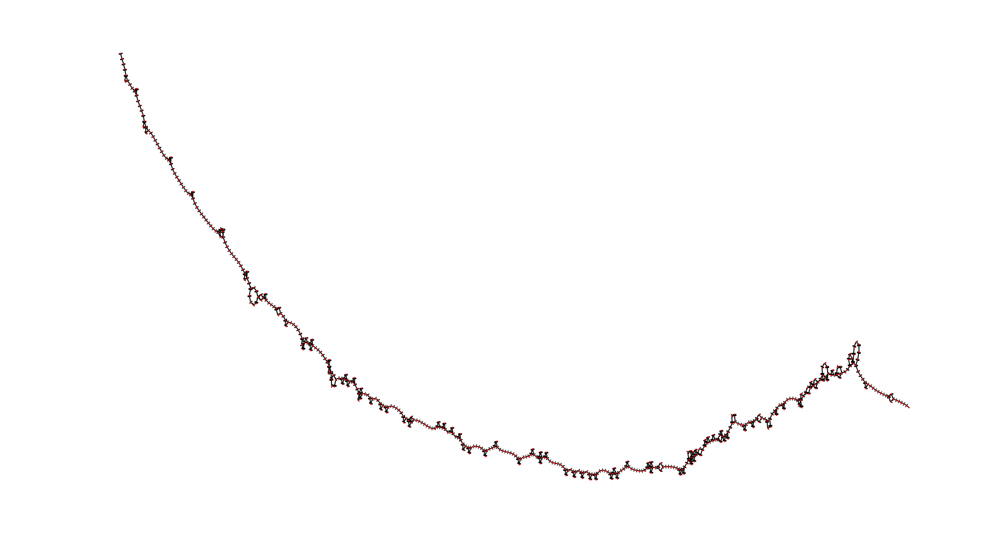

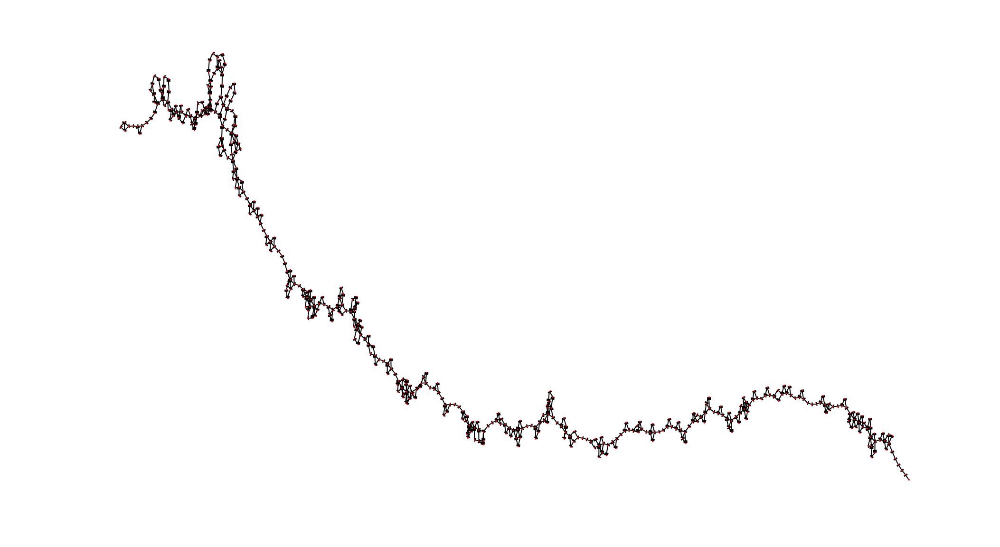

In [114]:
visualize(56, path_plot=True, consensus=True)